<ipython-input-48-2396af37f25a>:6: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IC) # visualize image
<ipython-input-48-2396af37f25a>:7: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


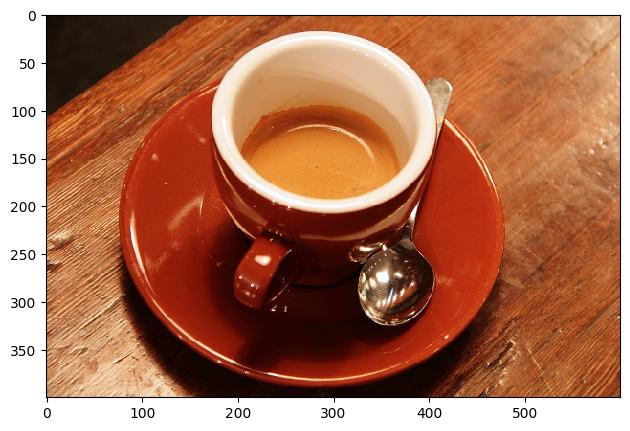

M = 400 columns, N = 600 rows, NC = 3 color channels


In [48]:
import skimage as sk # load skimage libraries
from skimage.io import imread
import numpy as np
IC = sk.data.coffee()
ICfloat = sk.img_as_float(IC)
sk.io.imshow(IC) # visualize image
sk.io.show()
print('M = {} columns, N = {} rows, NC = {} color channels'.format(*IC.shape))

<ipython-input-50-e0015bc4dae3>:6: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IG)


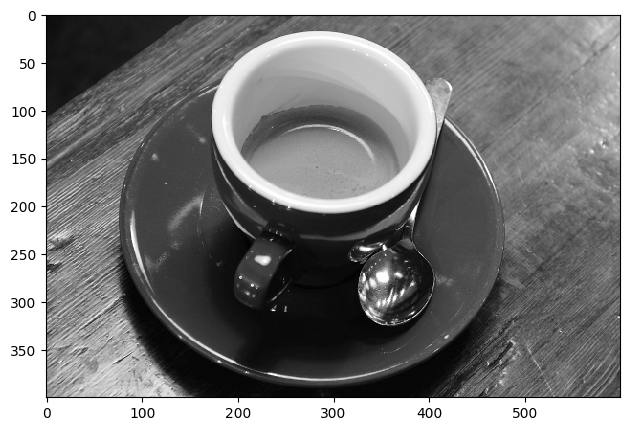

In [50]:
# Convert the image to grayscale
IG = sk.color.rgb2gray(IC)
IGfloat = sk.img_as_float(IG)
IG.shape
IGfloat.shape
sk.io.imshow(IG)

### Applying noise to the colored image

In [57]:
# Gaussian-distributed additive noise
gaussian = sk.util.random_noise(ICfloat, mode='gaussian', mean=0, var=0.01)

# Gaussian-distributed additive noise, with specified local variance at each point of image
local_var_map = 0.02 * np.ones_like(ICfloat)
localvar = sk.util.random_noise(ICfloat, mode='localvar', local_vars=local_var_map)

# Poisson-distributed noise
poisson = sk.util.random_noise(ICfloat, mode='poisson')

# Salt - replaces random pixels with 1
salt = sk.util.random_noise(ICfloat, mode='salt', amount=0.05)

# Pepper - replaces random pixels with 0 (for unsigned images) or -1 (for signed images)
pepper = sk.util.random_noise(ICfloat, mode='pepper', amount=0.05)

# Salt&Pepper - replaces random pixels with either 1 or, 0 (for unsigned images) or -1 for signed images
snp = sk.util.random_noise(ICfloat, mode='s&p', amount=0.05)

# Speckle - multiplicative noise using out = image + n*image, where n is Gaussian noise with specified mean & variance
speckle = sk.util.random_noise(ICfloat, mode='speckle', mean=0, var=0.04)

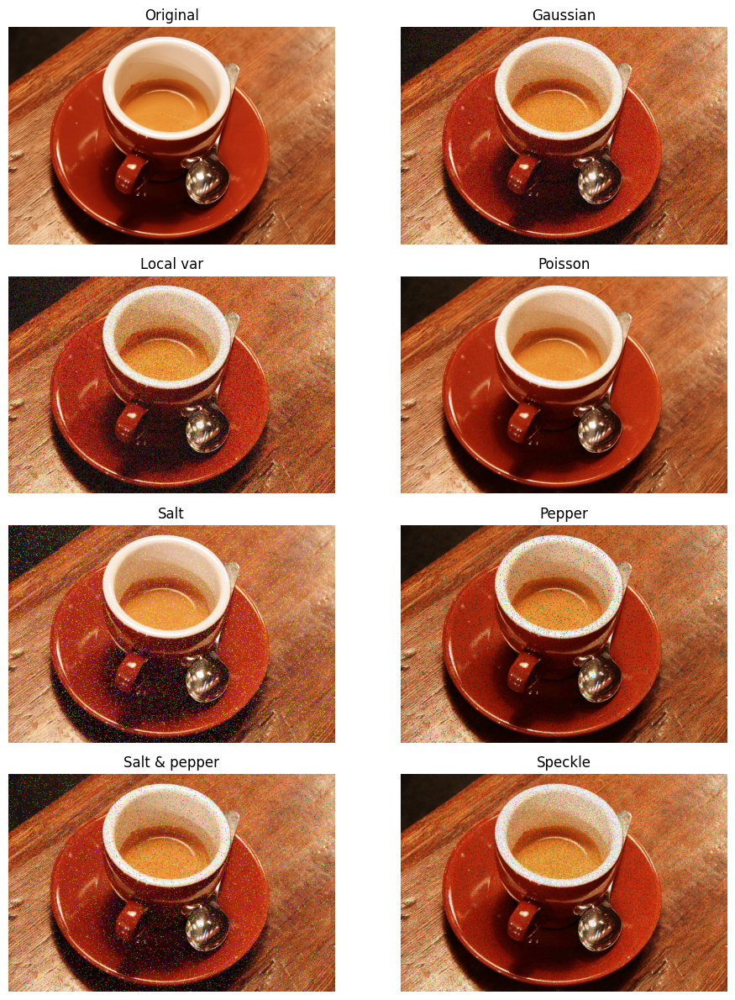

In [58]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(4, 2, figsize=(10, 12))
imgs = [ICfloat, gaussian, localvar, poisson, salt, pepper, snp, speckle]
titles = ['Original', 'Gaussian', 'Local var', 'Poisson',
          'Salt', 'Pepper', 'Salt & pepper', 'Speckle']

for a, im, t in zip(ax.ravel(), imgs, titles):
    a.imshow(np.clip(im, 0, 1))
   # a.imshow(imgs)
    a.set_title(t); a.axis('off')

plt.tight_layout()
plt.show()

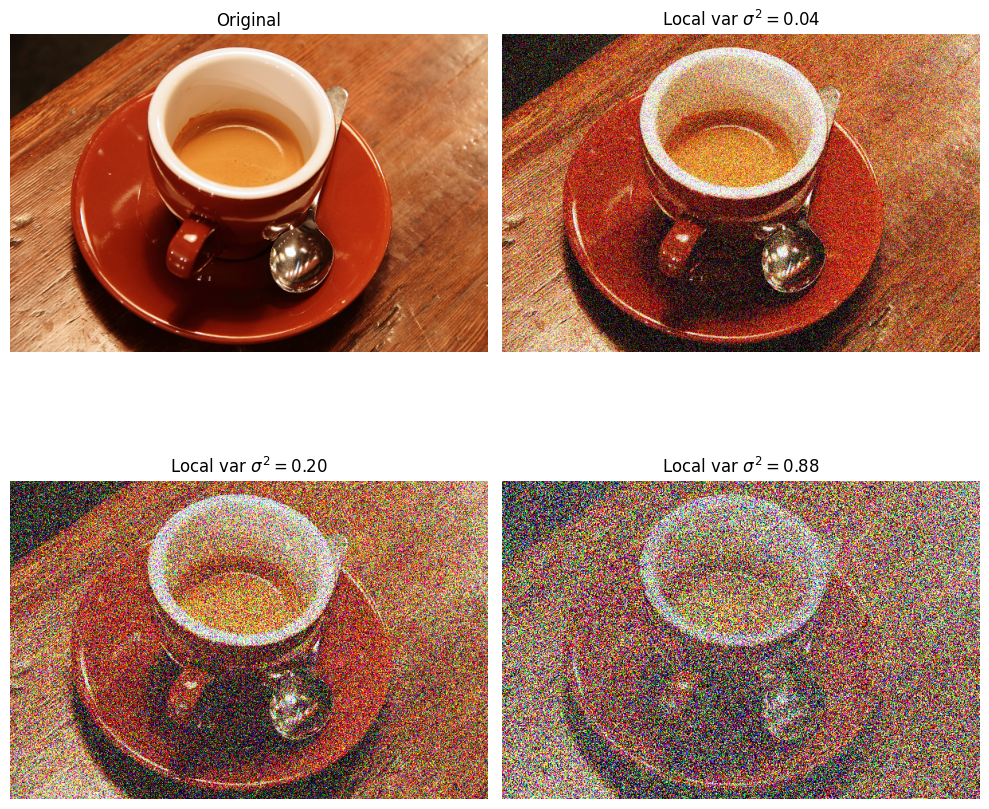

In [64]:
# Gaussian-distributed additive noise, with specified local variance at each point of image 0.04
local_var_map_1 = 0.04 * np.ones_like(ICfloat)
localvar_1 = sk.util.random_noise(ICfloat, mode='localvar', local_vars=local_var_map_1)

# Gaussian-distributed additive noise, with specified local variance at each point of image 0.2
local_var_map_2 = 0.2 * np.ones_like(ICfloat)
localvar_2 = sk.util.random_noise(ICfloat, mode='localvar', local_vars=local_var_map_2)

# Gaussian-distributed additive noise, with specified local variance at each point of image 0.88
local_var_map_3 = 0.88 * np.ones_like(ICfloat)
localvar_3 = sk.util.random_noise(ICfloat, mode='localvar', local_vars=local_var_map_3)

# Display in a 2×2 figure
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
images = [
    ICfloat,           # original grayscale (float, 0‒1)
    localvar_1,   # σ² = 0.04
    localvar_2,   # σ² = 0.20
    localvar_3    # σ² = 0.88
]

titles = [
    'Original',
    r'Local var $\sigma^2 = 0.04$',
    r'Local var $\sigma^2 = 0.20$',
    r'Local var $\sigma^2 = 0.88$'
]

for axis, img, title in zip(ax.ravel(), images, titles):
    axis.imshow(np.clip(img, 0, 1), cmap='gray', vmin=0, vmax=1)
    axis.set_title(title)
    axis.axis('off')

plt.tight_layout()
plt.show()

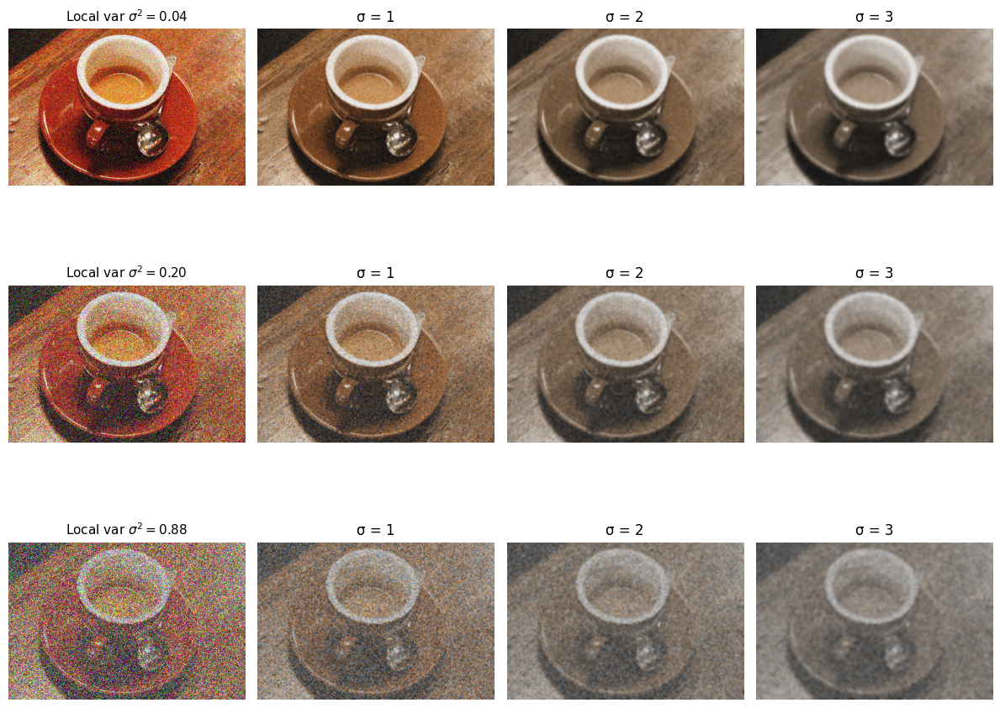

In [68]:
from skimage.filters import gaussian

sigmas = [1, 2, 3]          # low → medium → strong smoothing

noisy_imgs = [localvar_1, localvar_2, localvar_3]
sigma_labels = [rf'σ = {s}' for s in sigmas]

# Pre-compute all filtered versions
filtered_sets = [
    [gaussian(img, sigma=s, preserve_range=True) for s in sigmas]
    for img in noisy_imgs
]

# Display the 3 × 4 grid
fig, ax = plt.subplots(len(noisy_imgs), len(sigmas) + 1,
                       figsize=(12, 10))

row_titles = [r'Local var $\sigma^2=0.04$',
              r'Local var $\sigma^2=0.20$',
              r'Local var $\sigma^2=0.88$']

for r, (noisy, row_title, filt_imgs) in enumerate(
        zip(noisy_imgs, row_titles, filtered_sets)):

    # left-most: the noisy input itself
    ax[r, 0].imshow(np.clip(noisy, 0, 1), cmap='gray', vmin=0, vmax=1)
    ax[r, 0].set_title(row_title, fontsize=11)
    ax[r, 0].axis('off')

    # subsequent columns: σ-filtered versions
    for c, (filt, s) in enumerate(zip(filt_imgs, sigmas), start=1):
        ax[r, c].imshow(np.clip(filt, 0, 1), cmap='gray', vmin=0, vmax=1)
        ax[r, c].set_title(sigma_labels[c - 1])
        ax[r, c].axis('off')

plt.tight_layout()
plt.show()

### Applying noise to the grayscale image

In [53]:
# Gaussian-distributed additive noise
gaussian_gray = sk.util.random_noise(IG, mode='gaussian', mean=0, var=0.01)

# Gaussian-distributed additive noise, with specified local variance at each point of image
local_var_map_gray = 0.02 * np.ones_like(IGfloat)
localvar_gray = sk.util.random_noise(IGfloat, mode='localvar', local_vars=local_var_map_gray)

# Poisson-distributed noise
poisson_gray = sk.util.random_noise(IGfloat, mode='poisson')

# Salt - replaces random pixels with 1
salt_gray = sk.util.random_noise(IGfloat, mode='salt', amount=0.05)

# Pepper - replaces random pixels with 0 (for unsigned images) or -1 (for signed images)
pepper_gray = sk.util.random_noise(IGfloat, mode='pepper', amount=0.05)

# Salt&Pepper - replaces random pixels with either 1 or, 0 (for unsigned images) or -1 for signed images
snp_gray = sk.util.random_noise(IGfloat, mode='s&p', amount=0.05)

# Speckle - multiplicative noise using out = image + n*image, where n is Gaussian noise with specified mean & variance
speckle_gray = sk.util.random_noise(IGfloat, mode='speckle', mean=0, var=0.04)

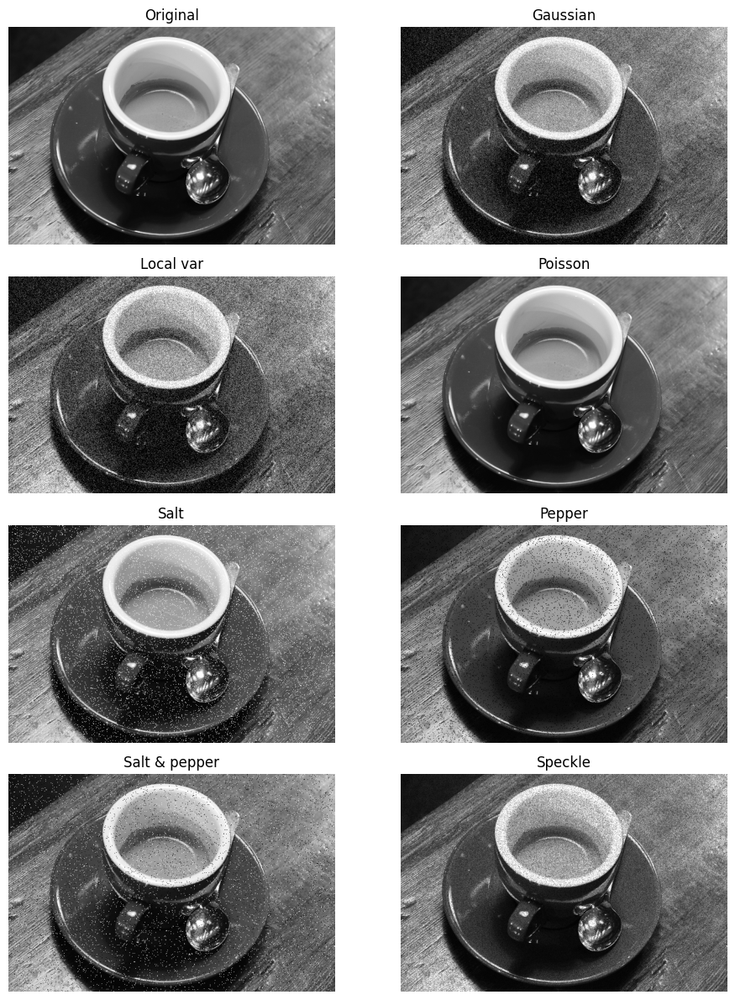

In [54]:
fig, ax = plt.subplots(4, 2, figsize=(10, 12))
imgs = [IG, gaussian_gray, localvar_gray, poisson_gray, salt_gray, pepper_gray, snp_gray, speckle_gray]
titles = ['Original', 'Gaussian', 'Local var', 'Poisson',
          'Salt', 'Pepper', 'Salt & pepper', 'Speckle']

for a, im, t in zip(ax.ravel(), imgs, titles):
    a.imshow(np.clip(im, 0, 1), cmap='gray', vmin=0, vmax=1)
   # a.imshow(imgs)
    a.set_title(t); a.axis('off')

plt.tight_layout()
plt.show()

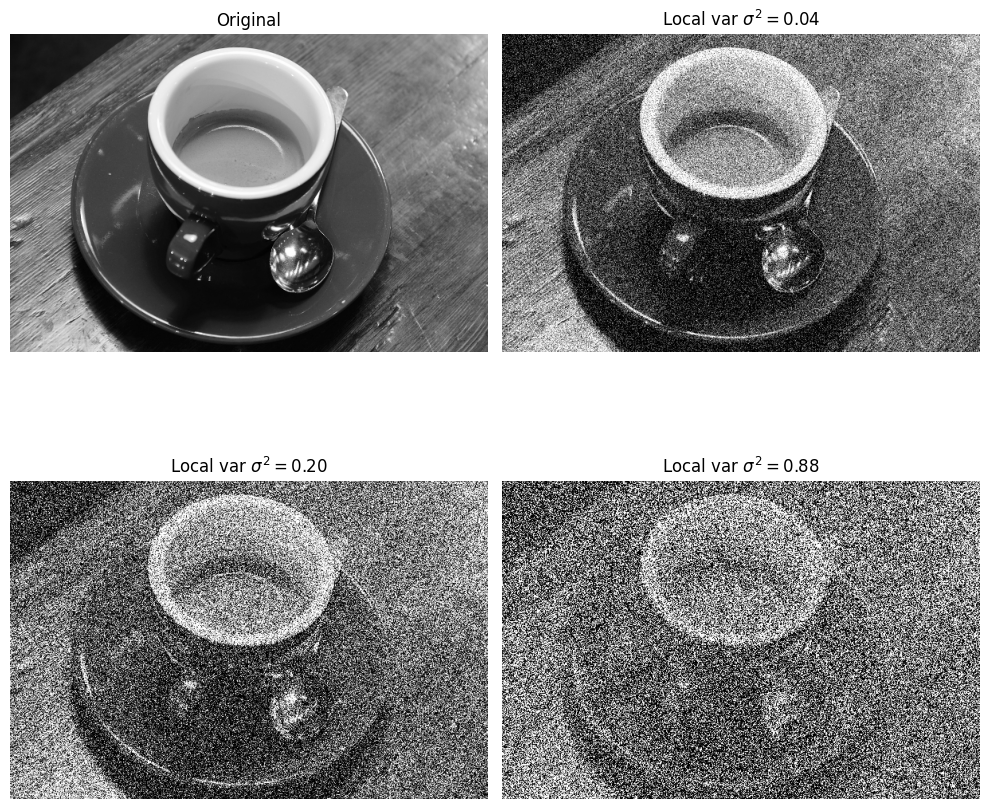

In [63]:
# Gaussian-distributed additive noise, with specified local variance at each point of image 0.04
local_var_map_gray_1 = 0.04 * np.ones_like(IGfloat)
localvar_gray_1 = sk.util.random_noise(IGfloat, mode='localvar', local_vars=local_var_map_gray_1)

# Gaussian-distributed additive noise, with specified local variance at each point of image 0.2
local_var_map_gray_2 = 0.2 * np.ones_like(IGfloat)
localvar_gray_2 = sk.util.random_noise(IGfloat, mode='localvar', local_vars=local_var_map_gray_2)

# Gaussian-distributed additive noise, with specified local variance at each point of image 0.88
local_var_map_gray_3 = 0.88 * np.ones_like(IGfloat)
localvar_gray_3 = sk.util.random_noise(IGfloat, mode='localvar', local_vars=local_var_map_gray_3)

# Display in a 2×2 figure
fig, ax = plt.subplots(2, 2, figsize=(10, 10))
images = [
    IGfloat,           # original grayscale (float, 0‒1)
    localvar_gray_1,   # σ² = 0.04
    localvar_gray_2,   # σ² = 0.20
    localvar_gray_3    # σ² = 0.88
]

titles = [
    'Original',
    r'Local var $\sigma^2 = 0.04$',
    r'Local var $\sigma^2 = 0.20$',
    r'Local var $\sigma^2 = 0.88$'
]

for axis, img, title in zip(ax.ravel(), images, titles):
    axis.imshow(np.clip(img, 0, 1), cmap='gray', vmin=0, vmax=1)
    axis.set_title(title)
    axis.axis('off')

plt.tight_layout()
plt.show()

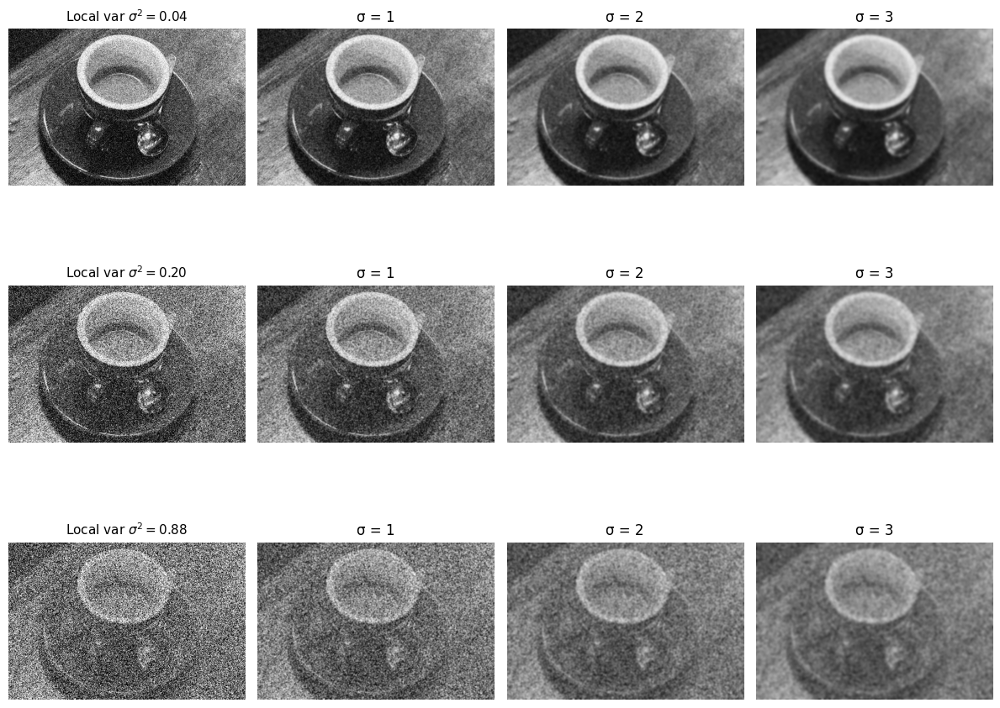

In [66]:
from skimage.filters import gaussian

sigmas = [1, 2, 3]          # low → medium → strong smoothing

noisy_imgs = [localvar_gray_1, localvar_gray_2, localvar_gray_3]
sigma_labels = [rf'σ = {s}' for s in sigmas]

# Pre-compute all filtered versions
filtered_sets = [
    [gaussian(img, sigma=s, preserve_range=True) for s in sigmas]
    for img in noisy_imgs
]

# Display the 3 × 4 grid
fig, ax = plt.subplots(len(noisy_imgs), len(sigmas) + 1,
                       figsize=(12, 10))

row_titles = [r'Local var $\sigma^2=0.04$',
              r'Local var $\sigma^2=0.20$',
              r'Local var $\sigma^2=0.88$']

for r, (noisy, row_title, filt_imgs) in enumerate(
        zip(noisy_imgs, row_titles, filtered_sets)):

    # left-most: the noisy input itself
    ax[r, 0].imshow(np.clip(noisy, 0, 1), cmap='gray', vmin=0, vmax=1)
    ax[r, 0].set_title(row_title, fontsize=11)
    ax[r, 0].axis('off')

    # subsequent columns: σ-filtered versions
    for c, (filt, s) in enumerate(zip(filt_imgs, sigmas), start=1):
        ax[r, c].imshow(np.clip(filt, 0, 1), cmap='gray', vmin=0, vmax=1)
        ax[r, c].set_title(sigma_labels[c - 1])
        ax[r, c].axis('off')

plt.tight_layout()
plt.show()

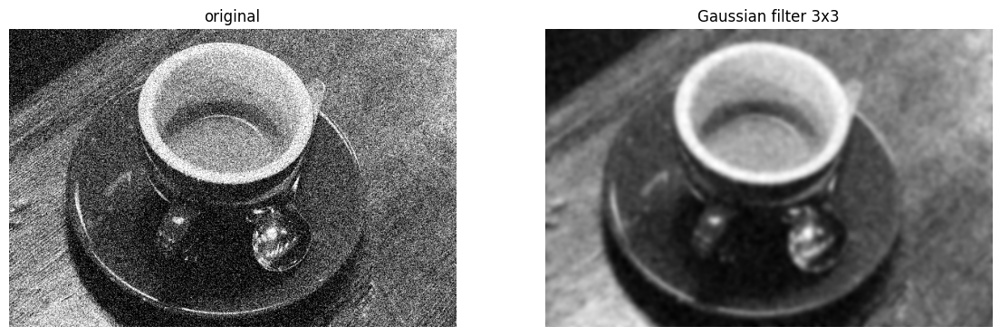

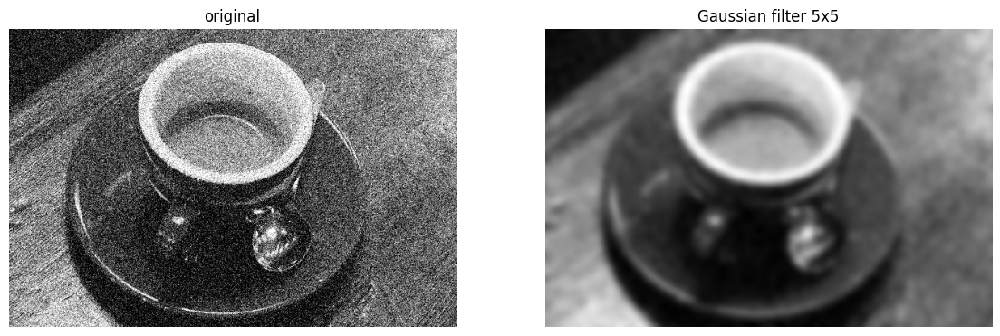

In [71]:
from skimage.filters import gaussian
from skimage.color import rgb2gray

def plot_comparison(original, filtered, filter_name):

    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(14, 6), sharex=True,
                                   sharey=True)
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title('original')
    ax1.axis('off')
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(filter_name)
    ax2.axis('off')

img_f = gaussian(localvar_gray_1, 3)
plot_comparison(localvar_gray_1, img_f, 'Gaussian filter 3x3')


img_f = gaussian(localvar_gray_1, 5)
plot_comparison(localvar_gray_1, img_f, 'Gaussian filter 5x5')

## Results
For the light-noise row (σ² = 0.04), σ = 1 is already enough; larger kernels mostly blur detail rather than improve. The same thing is also detected for the medium and high noise row.
It can be observed that σ = 2 and σ = 3 oversmooths the images.
On the last image, where the variance is the highest, it can be seen that the gaussian filter doesn't make much of a difference in reducing the noise of the image.

<ipython-input-81-0a78686441fd>:2: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()
<ipython-input-81-0a78686441fd>:3: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IG)


Grayscale image (1 channel)


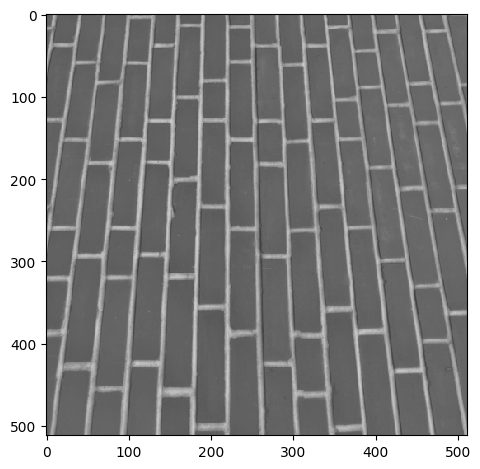

In [81]:
IG = sk.data.brick()
sk.io.show()
sk.io.imshow(IG)

# Find whether the image is grayscale or RGB by the number of channels it has
if IG.ndim == 2:
    print("Grayscale image (1 channel)")
    num_channels = 1
elif IG.ndim == 3:
    num_channels = IG.shape[2]
    print(f"Color image with {num_channels} channels")
else:
    print("Unexpected image format")

Edge pixels : 20.21%
Brick pixels: 79.79%


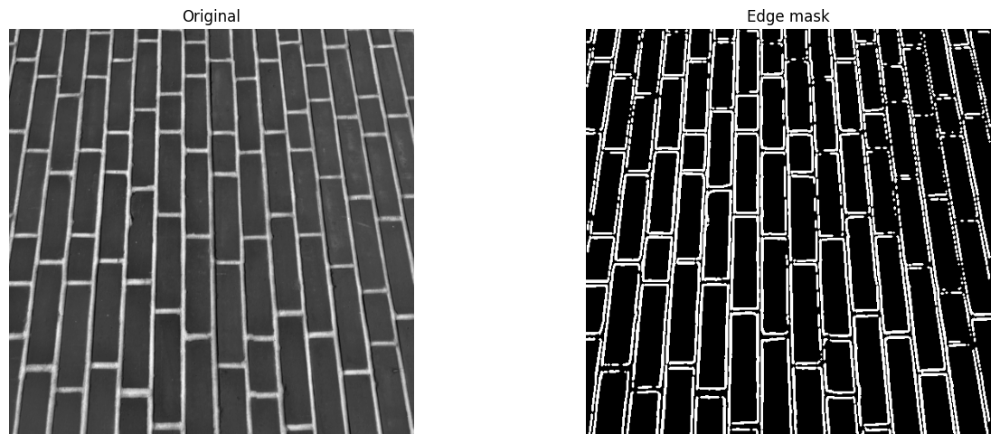

In [87]:
from skimage.filters import prewitt, threshold_otsu
from skimage.morphology import binary_opening, disk

# Mild smoothing to reduce sensor grain
IG_smooth = gaussian(IG, sigma=1, preserve_range=True)

# Prewitt gradient magnitude
grad = prewitt(IG_smooth)

# Automatic threshold to pick “strong” edges
T = threshold_otsu(grad) * 1.2 # Otsu, then relax (×1.2) to keep only bold edges
edge_mask = grad > T # boolean mask: True = edge pixel

# Morphological clean-up
edge_mask = binary_opening(edge_mask, disk(1)) # remove specks, mend tiny gaps

# Statistics
edge_fraction  = edge_mask.mean() # fraction of True (edge) pixels
brick_fraction = 1 - edge_fraction

print(f'Edge pixels : {edge_fraction :6.2%}')
print(f'Brick pixels: {brick_fraction:6.2%}')


fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].imshow(IG, cmap='gray');
ax[0].set_title('Original'); ax[0].axis('off')
ax[1].imshow(edge_mask, cmap='gray');
ax[1].set_title('Edge mask'); ax[1].axis('off')
plt.tight_layout();
plt.show()